In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Rescaling,Resizing, RandomFlip, RandomRotation
import time


In [2]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 50

In [3]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "Dataset",
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


In [4]:
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

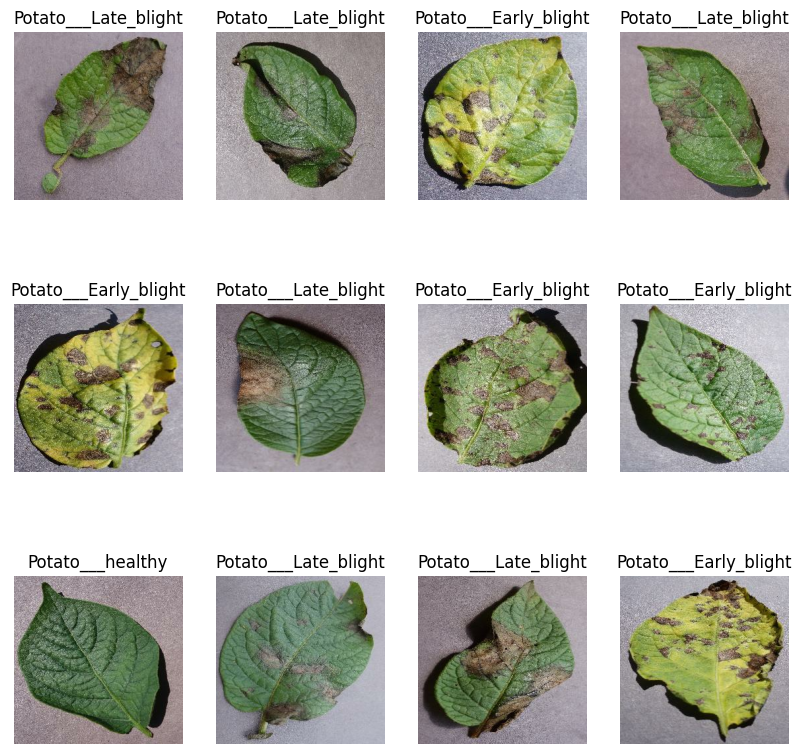

In [5]:
plt.figure(figsize=(10, 10))
for image_batch, label_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("int"))
        plt.title(class_names[label_batch[i]])
        plt.axis("off")

In [6]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed = 12)
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)

    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds

In [7]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [8]:
len(train_ds)

54

In [9]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
test_ds  = test_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)

In [10]:
resize_and_rescale  = tf.keras.Sequential([
    Rescaling(1.0/255),
    Resizing(IMAGE_SIZE, IMAGE_SIZE),
])

In [11]:
data_augmentation = tf.keras.Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
])

In [12]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

custom_model = models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(32, kernel_size = (3,3), activation = "relu", input_shape = input_shape),
    layers.MaxPooling2D(pool_size = (2,2)),
    layers.Conv2D(64, kernel_size = (3,3), activation = "relu"),
    layers.MaxPooling2D(pool_size = (2,2)),
    layers.Conv2D(64, kernel_size = (3,3), activation = "relu"),
    layers.MaxPooling2D(pool_size = (2,2)),
    layers.Conv2D(64, kernel_size = (3,3), activation = "relu"),
    layers.MaxPooling2D(pool_size = (2,2)),
    layers.Conv2D(64, kernel_size = (3,3), activation = "relu"),
    layers.MaxPooling2D(pool_size = (2,2)),
    layers.Conv2D(64, kernel_size = (3,3), activation = "relu"),
    layers.MaxPooling2D(pool_size = (2,2)),
    layers.Flatten(),
    layers.Dense(128, activation = "relu"),
    layers.Dense(n_classes, activation = "softmax"),
])

custom_model.build(input_shape = input_shape)

c:\Users\Sahil\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [13]:
custom_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 256, 256, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (32, 256, 256, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (32, 254, 254, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (32, 127, 127, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (32, 125, 125, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (32, 62, 62, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (32, 60, 60, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (32, 30, 30, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (32, 28, 28, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (32, 14, 14, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (32, 12, 12, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (32, 6, 6, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (32, 4, 4, 64)         │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (32, 2, 2, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (32, 256)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (32, 128)              │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (32, 3)                │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 200,387 (782.76 KB)

 Trainable params: 200,387 (782.76 KB)

 Non-trainable params: 0 (0.00 B)

In [14]:
model_results = {}

start_time = time.time()

custom_model.compile(
    optimizer = "adam",
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = False),
    metrics = ["accuracy"]
)

history_custom =  custom_model.fit(
    train_ds,
    epochs = EPOCHS,
    batch_size = BATCH_SIZE,
    verbose = 1,
    validation_data = val_ds
)

total_training_time_custom = time.time() - start_time
average_time_per_epoch_custom = total_training_time_custom / EPOCHS

model_results['Custom Model'] = {
    'training_time': total_training_time_custom,
    'avg_time_per_epoch': average_time_per_epoch_custom
}

Epoch 1/50


50/54 ━━━━━━━━━━━━━━━━━━━━ 3s 848ms/step - accuracy: 0.4490 - loss: 0.9368

KeyboardInterrupt: 

In [14]:
from tensorflow.keras.applications import VGG16

vgg16_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
vgg16_model.trainable = False

model_vgg16 = tf.keras.Sequential([
    resize_and_rescale,
    data_augmentation,
    vgg16_model,
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(len(class_names), activation='softmax')
])

model_vgg16.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

start_time = time.time()

history_vgg16 = model_vgg16.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=val_ds
)

total_training_time_vgg16 = time.time() - start_time
average_time_per_epoch_vgg16 = total_training_time_vgg16 / EPOCHS

model_results['VGG16'] = {
    'training_time': total_training_time_vgg16,
    'avg_time_per_epoch': average_time_per_epoch_vgg16
}


Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.6281 - loss: 3.4191 - val_accuracy: 0.9219 - val_loss: 0.2352
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - accuracy: 0.9067 - loss: 0.2683 - val_accuracy: 0.9635 - val_loss: 0.1684
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 147s 3s/step - accuracy: 0.9383 - loss: 0.1783 - val_accuracy: 0.9531 - val_loss: 0.1295
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 138s 3s/step - accuracy: 0.9377 - loss: 0.1673 - val_accuracy: 0.9688 - val_loss: 0.1036
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - accuracy: 0.9486 - loss: 0.1430 - val_accuracy: 0.9740 - val_loss: 0.0979
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - accuracy: 0.9591 - loss: 0.1038 - val_accuracy: 0.9167 - val_loss: 0.2055
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - accuracy: 0.9579 - loss: 0.1161 - val_accuracy: 0.9583 - val_loss: 0.1116
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 142s 3s/step - accuracy: 0.9600 - loss: 0.1158 - val_accuracy: 0.9635 - v

In [15]:
from tensorflow.keras.applications import ResNet50

resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
resnet50_model.trainable = False

model_resnet50 = tf.keras.Sequential([
    resize_and_rescale,
    data_augmentation,
    resnet50_model,
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(len(class_names), activation='softmax')
])

model_resnet50.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)
start_time = time.time()

history_resnet50 = model_resnet50.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=val_ds
)
total_training_time_resnet50 = time.time() - start_time
average_time_per_epoch_resnet50 = total_training_time_resnet50 / EPOCHS

model_results['ResNet50'] = {
    'training_time': total_training_time_resnet50,
    'avg_time_per_epoch': average_time_per_epoch_resnet50
}

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 155s 3s/step - accuracy: 0.4352 - loss: 7.9081 - val_accuracy: 0.4844 - val_loss: 1.0864
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 139s 3s/step - accuracy: 0.4551 - loss: 1.0817 - val_accuracy: 0.4844 - val_loss: 1.0667
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 138s 3s/step - accuracy: 0.4859 - loss: 1.0627 - val_accuracy: 0.4844 - val_loss: 1.0485
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 140s 3s/step - accuracy: 0.4561 - loss: 1.0563 - val_accuracy: 0.4844 - val_loss: 1.0322
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 140s 3s/step - accuracy: 0.4634 - loss: 1.0280 - val_accuracy: 0.4844 - val_loss: 1.0172
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 140s 3s/step - accuracy: 0.4460 - loss: 1.0177 - val_accuracy: 0.4844 - val_loss: 1.0040
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 141s 3s/step - accuracy: 0.4666 - loss: 0.9982 - val_accuracy: 0.4844 - val_loss: 0.9920
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 114s 2s/step - accuracy: 0.4741 - loss: 0.9921 - val_accuracy: 0.4844 - v

In [16]:
from tensorflow.keras.applications import MobileNet

mobilenet_model = MobileNet(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
mobilenet_model.trainable = False

model_mobilenet = tf.keras.Sequential([
    resize_and_rescale,
    data_augmentation,
    mobilenet_model,
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(len(class_names), activation='softmax')
])

model_mobilenet.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

start_time = time.time()

history_mobilenet = model_mobilenet.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=val_ds
)

total_training_time_mobilenet = time.time() - start_time
average_time_per_epoch_mobilenet = total_training_time_mobilenet / EPOCHS

model_results['MobileNet'] = {
    'training_time': total_training_time_mobilenet,
    'avg_time_per_epoch': average_time_per_epoch_mobilenet
}

C:\Users\Sahil\AppData\Local\Temp\ipykernel_24376\2854939195.py:3: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet_model = MobileNet(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))


Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 53s 916ms/step - accuracy: 0.7149 - loss: 12.4182 - val_accuracy: 0.9167 - val_loss: 1.1300
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 919ms/step - accuracy: 0.9583 - loss: 0.3853 - val_accuracy: 0.9531 - val_loss: 0.4387
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 920ms/step - accuracy: 0.9719 - loss: 0.1699 - val_accuracy: 0.9844 - val_loss: 0.1706
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 915ms/step - accuracy: 0.9803 - loss: 0.1440 - val_accuracy: 0.9740 - val_loss: 0.1828
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 912ms/step - accuracy: 0.9842 - loss: 0.0637 - val_accuracy: 0.9635 - val_loss: 0.2276
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 907ms/step - accuracy: 0.9735 - loss: 0.1978 - val_accuracy: 0.9688 - val_loss: 0.1479
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 53s 979ms/step - accuracy: 0.9760 - loss: 0.1956 - val_accuracy: 0.9688 - val_loss: 0.3059
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 944ms/step - accuracy: 0.9884 - loss: 0.0936 - val_acc

In [17]:
from tensorflow.keras.applications import EfficientNetB0

efficientnet_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
efficientnet_model.trainable = False

model_efficientnet = tf.keras.Sequential([
    resize_and_rescale,
    data_augmentation,
    efficientnet_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dense(len(class_names), activation='softmax')
])

model_efficientnet.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

start_time = time.time()
history_efficientnet = model_efficientnet.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=val_ds
)

total_training_time_efficientnet = time.time() - start_time
average_time_per_epoch_efficientnet = total_training_time_efficientnet / EPOCHS

model_results['EfficientNet'] = {
    'training_time': total_training_time_efficientnet,
    'avg_time_per_epoch': average_time_per_epoch_efficientnet
}

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 97s 2s/step - accuracy: 0.4013 - loss: 0.9779 - val_accuracy: 0.4844 - val_loss: 0.9166
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.4488 - loss: 0.9332 - val_accuracy: 0.4844 - val_loss: 0.9180
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.5005 - loss: 0.9152 - val_accuracy: 0.4479 - val_loss: 0.9186
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.4510 - loss: 0.9350 - val_accuracy: 0.4844 - val_loss: 0.8980
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.4681 - loss: 0.9226 - val_accuracy: 0.4844 - val_loss: 0.9079
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.4696 - loss: 0.9202 - val_accuracy: 0.4844 - val_loss: 0.9043
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.4772 - loss: 0.9253 - val_accuracy: 0.4844 - val_loss: 0.9046
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.4957 - loss: 0.9363 - val_accuracy: 0.4479 - val_loss:

In [42]:
scores_custom_model = custom_model.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step - accuracy: 0.9918 - loss: 0.0240


In [18]:
scores_vgg16 = model_vgg16.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 65s 7s/step - accuracy: 0.9967 - loss: 0.0118


In [19]:
scores_resnet50 = model_resnet50.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - accuracy: 0.4680 - loss: 0.8814


In [20]:
scores_mobilenet = model_mobilenet.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 786ms/step - accuracy: 1.0000 - loss: 2.5193e-04


In [30]:
scores_efficientnet = model_efficientnet.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.5260 - loss: 0.9003


In [43]:
history_custom.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [21]:
history_vgg16.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [22]:
history_resnet50.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [31]:
history_mobilenet.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [32]:
history_efficientnet.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [44]:
acc_custom = history_custom.history['accuracy']
val_acc_custom = history_custom.history['val_accuracy']

loss_custom = history_custom.history['loss']
val_loss_custom = history_custom.history['val_loss']

In [23]:
acc_vgg16 = history_vgg16.history['accuracy']
val_acc_vgg16 = history_vgg16.history['val_accuracy']

loss_vgg16 = history_vgg16.history['loss']
val_loss_vgg16 = history_vgg16.history['val_loss']

In [24]:
acc_resnet50 = history_resnet50.history['accuracy']
val_acc_resnet50 = history_resnet50.history['val_accuracy']

loss_resnet50 = history_resnet50.history['loss']
val_loss_resnet50 = history_resnet50.history['val_loss']

In [33]:
acc_mobilenet = history_mobilenet.history['accuracy']
val_acc_mobilenet = history_mobilenet.history['val_accuracy']

loss_mobilenet = history_mobilenet.history['loss']
val_loss_mobilenet = history_mobilenet.history['val_loss']

In [34]:
acc_efficientnet = history_efficientnet.history['accuracy']
val_acc_efficientnet = history_efficientnet.history['val_accuracy']

loss_efficientnet = history_efficientnet.history['loss']
val_loss_efficientnet = history_efficientnet.history['val_loss']

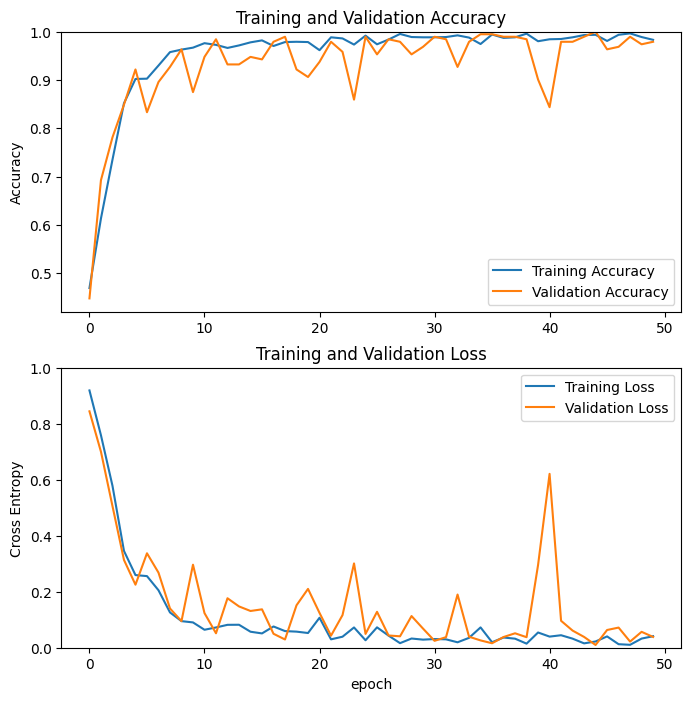

In [45]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc_custom, label='Training Accuracy')
plt.plot(val_acc_custom, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss_custom, label='Training Loss')
plt.plot(val_loss_custom, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

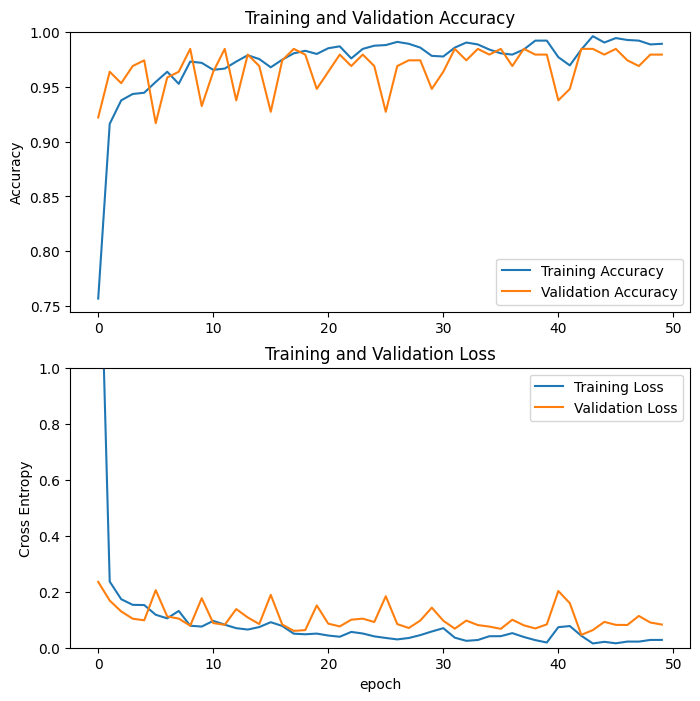

In [25]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc_vgg16, label='Training Accuracy')
plt.plot(val_acc_vgg16, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss_vgg16, label='Training Loss')
plt.plot(val_loss_vgg16, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

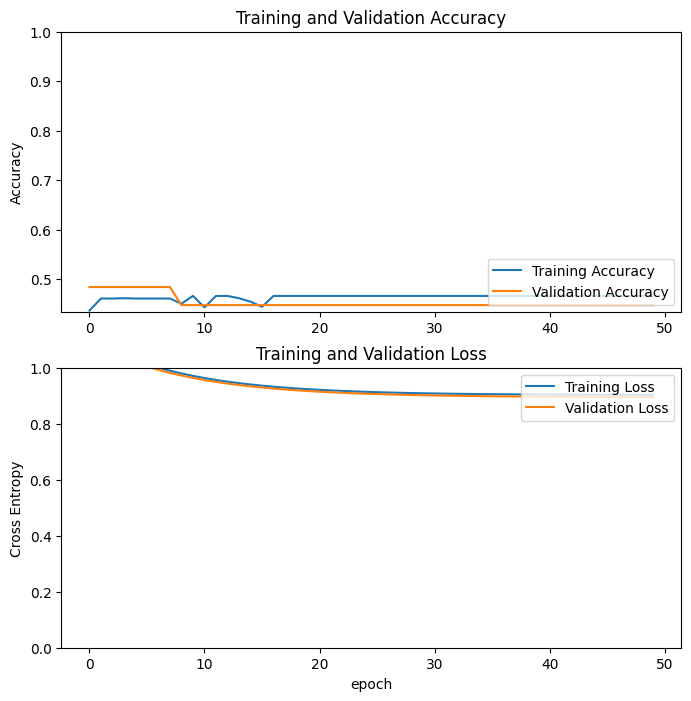

In [26]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc_resnet50, label='Training Accuracy')
plt.plot(val_acc_resnet50, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss_resnet50, label='Training Loss')
plt.plot(val_loss_resnet50, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

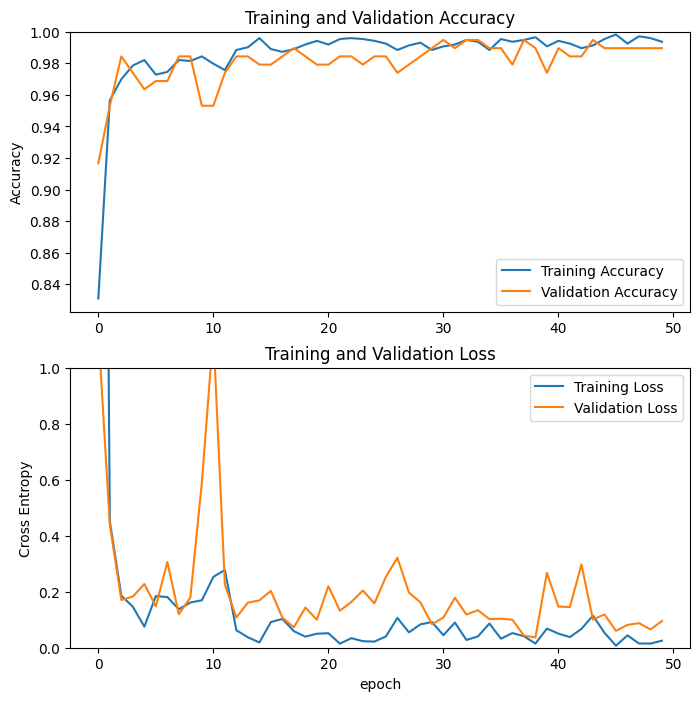

In [35]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc_mobilenet, label='Training Accuracy')
plt.plot(val_acc_mobilenet, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss_mobilenet, label='Training Loss')
plt.plot(val_loss_mobilenet, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

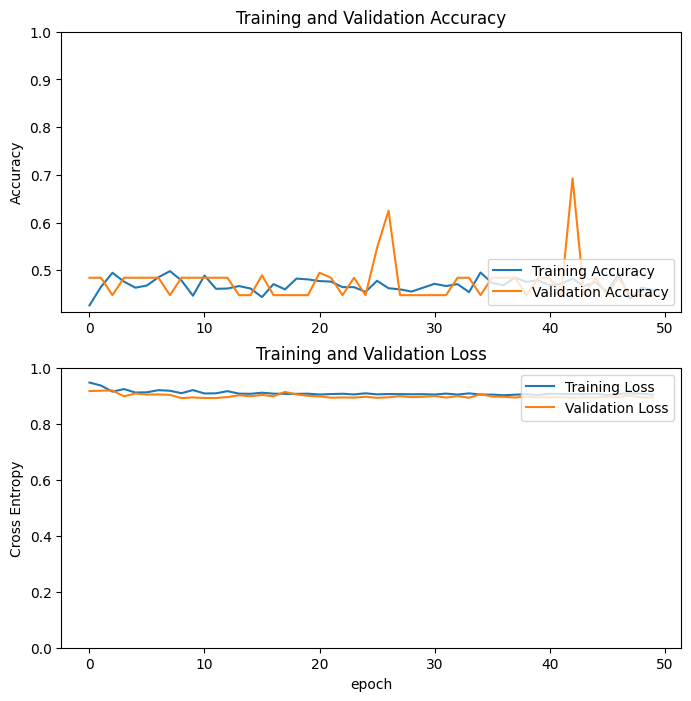

In [36]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc_efficientnet, label='Training Accuracy')
plt.plot(val_acc_efficientnet, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss_efficientnet, label='Training Loss')
plt.plot(val_loss_efficientnet, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

first image to predict
actual label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step
predicted label: Potato___Late_blight


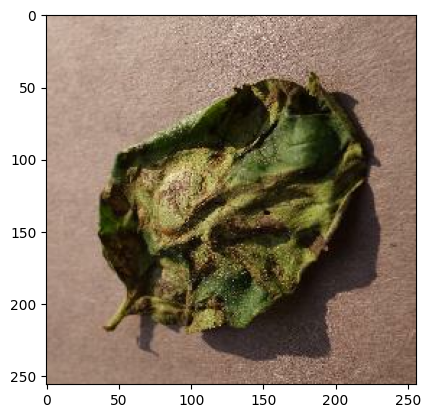

In [46]:
import numpy as np
for image_batch, label_batch in test_ds.take(1):
    first_image = image_batch[0].numpy().astype('int')
    first_label = label_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = custom_model.predict(image_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

first image to predict
actual label: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
predicted label: Potato___Early_blight


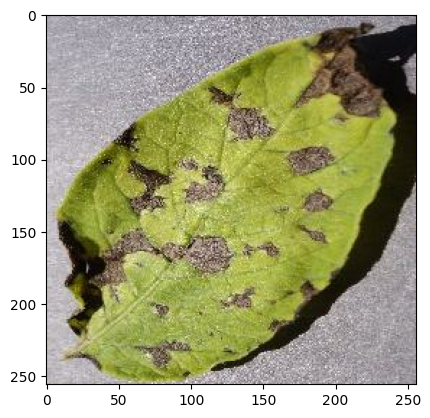

In [38]:
import numpy as np
for image_batch, label_batch in test_ds.take(1):
    first_image = image_batch[0].numpy().astype('int')
    first_label = label_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = model_vgg16.predict(image_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

first image to predict
actual label: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
predicted label: Potato___Early_blight


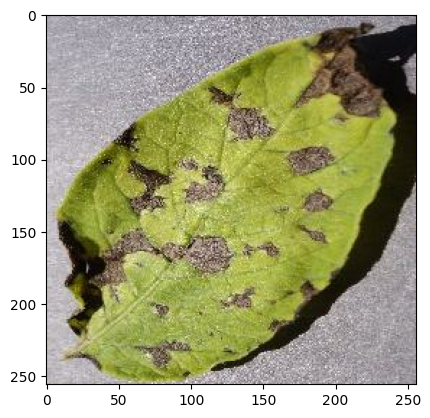

In [47]:
import numpy as np
for image_batch, label_batch in test_ds.take(1):
    first_image = image_batch[0].numpy().astype('int')
    first_label = label_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = model_resnet50.predict(image_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

first image to predict
actual label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
predicted label: Potato___Late_blight


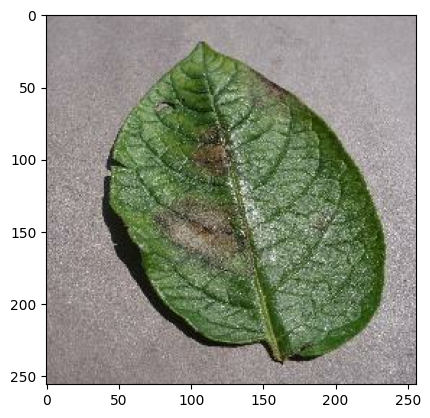

In [48]:
import numpy as np
for image_batch, label_batch in test_ds.take(1):
    first_image = image_batch[0].numpy().astype('int')
    first_label = label_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = model_mobilenet.predict(image_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

first image to predict
actual label: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
predicted label: Potato___Early_blight


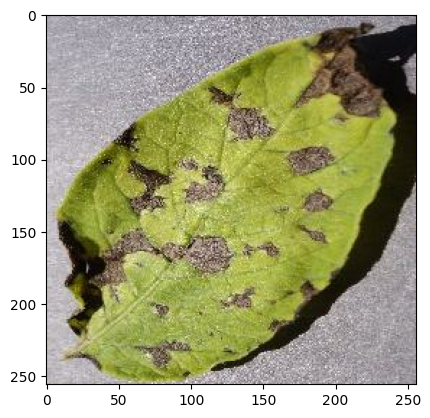

In [49]:
import numpy as np
for image_batch, label_batch in test_ds.take(1):
    first_image = image_batch[0].numpy().astype('int')
    first_label = label_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = model_efficientnet.predict(image_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [28]:
def predict(model,image):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


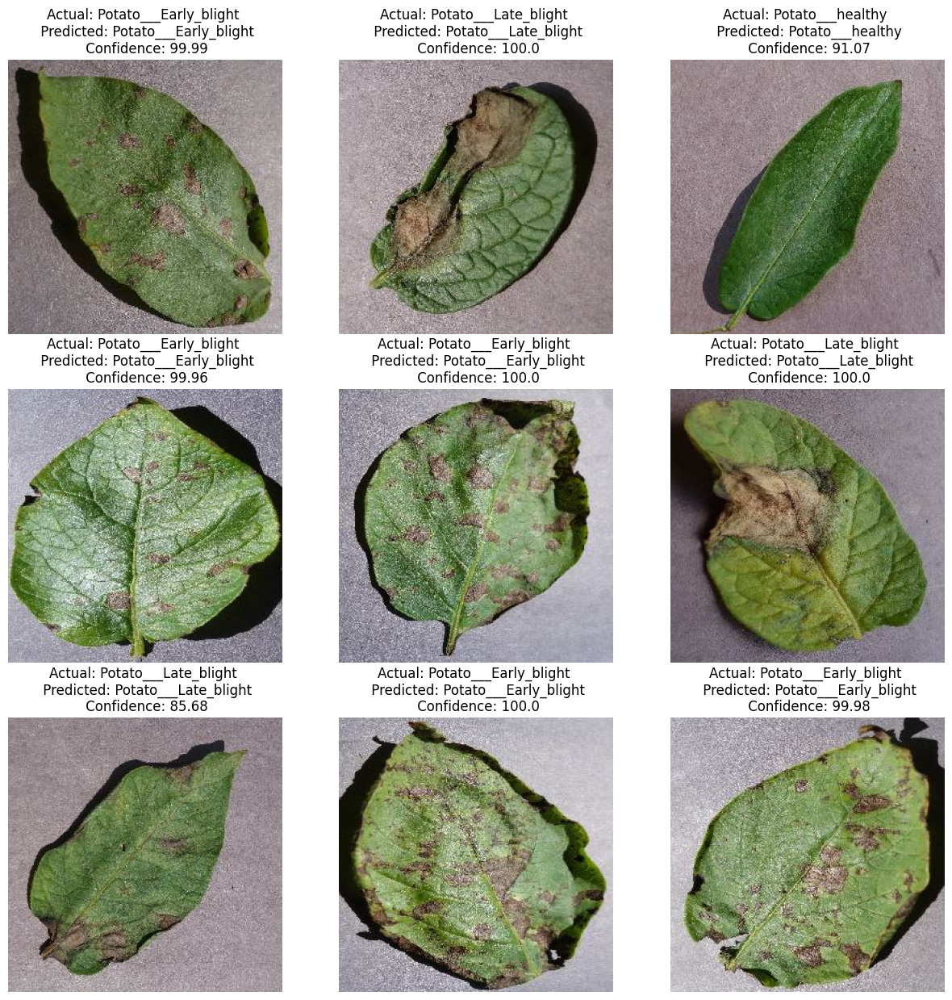

In [50]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("int"))
        
        predicted_class, confidence = predict(custom_model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class} \n Predicted: {predicted_class}\n Confidence: {confidence}")
        plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


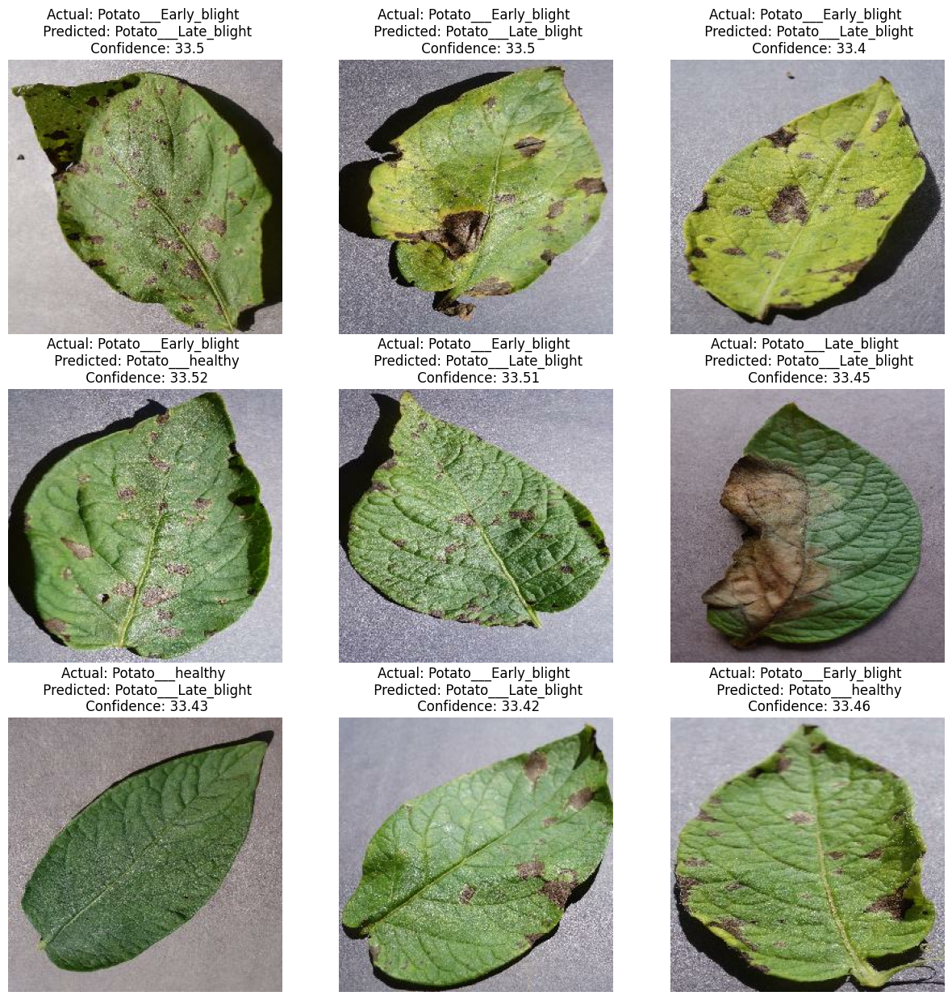

In [29]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("int"))
        
        predicted_class, confidence = predict(model_vgg16, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class} \n Predicted: {predicted_class}\n Confidence: {confidence}")
        plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


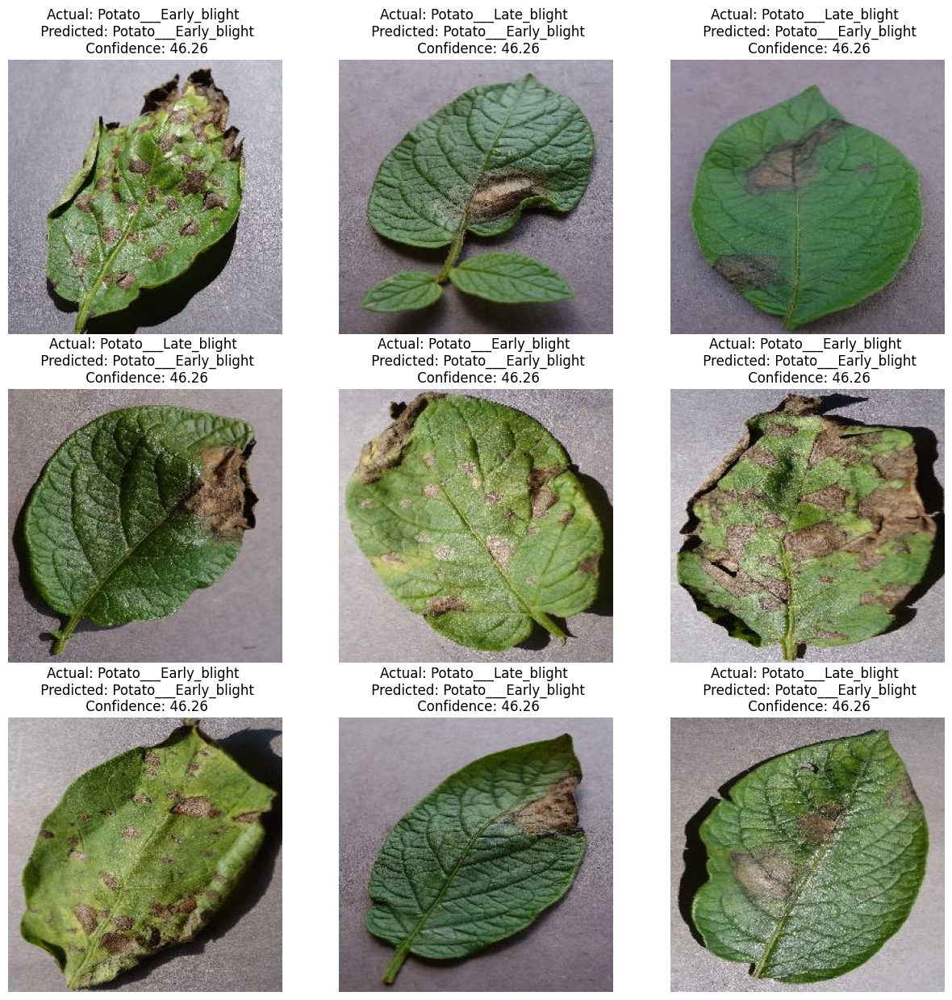

In [51]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("int"))
        
        predicted_class, confidence = predict(model_resnet50, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class} \n Predicted: {predicted_class}\n Confidence: {confidence}")
        plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


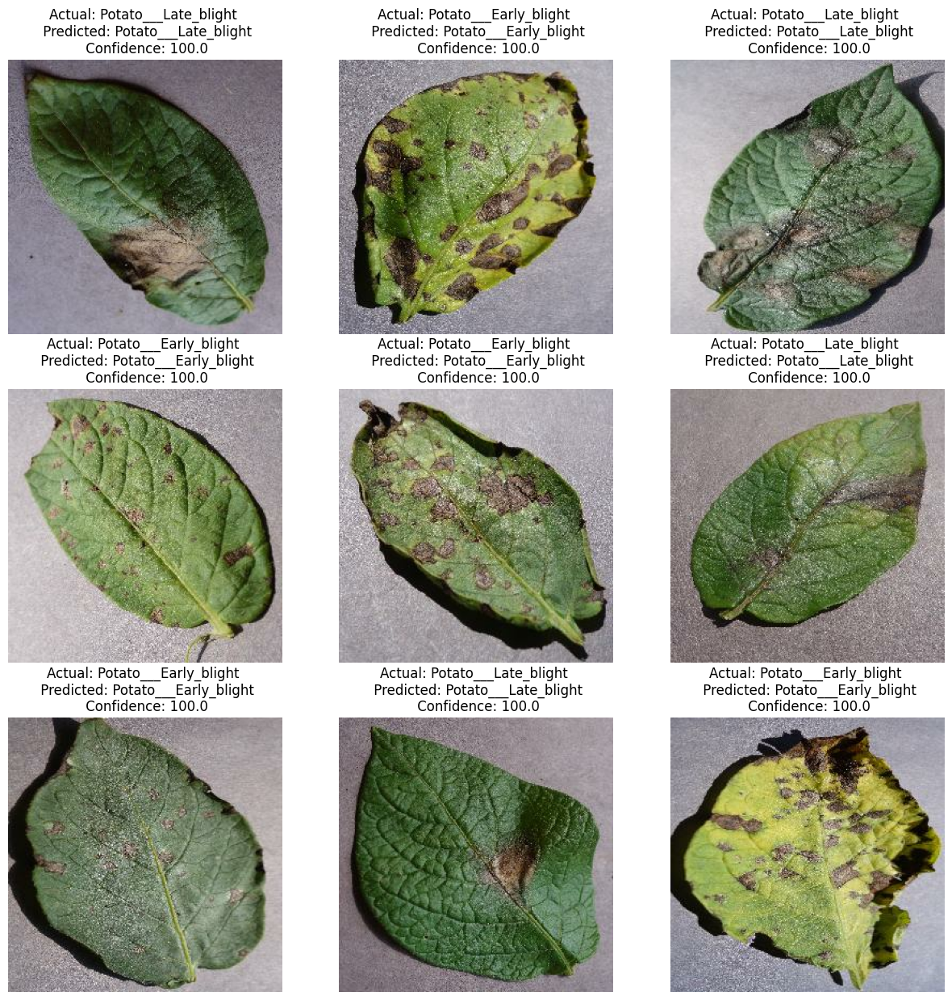

In [52]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("int"))
        
        predicted_class, confidence = predict(model_mobilenet, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class} \n Predicted: {predicted_class}\n Confidence: {confidence}")
        plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


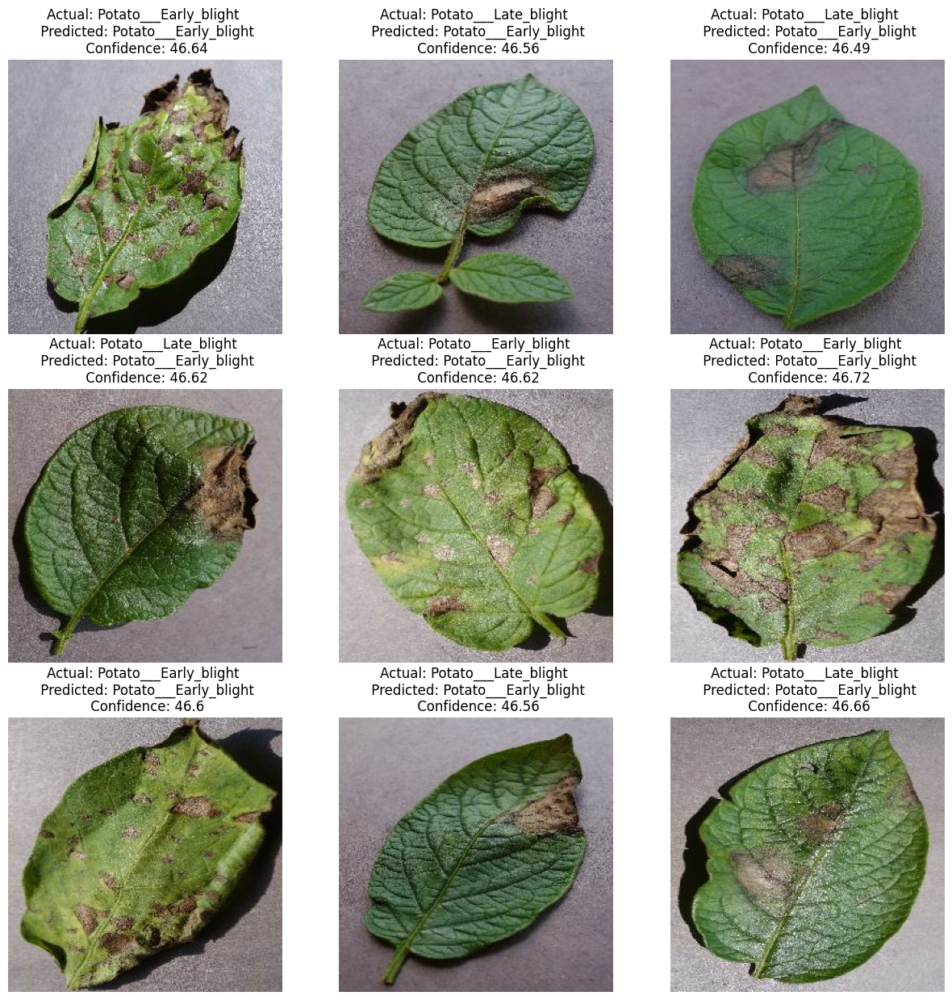

In [54]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("int"))
        
        predicted_class, confidence = predict(model_efficientnet, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class} \n Predicted: {predicted_class}\n Confidence: {confidence}")
        plt.axis("off")

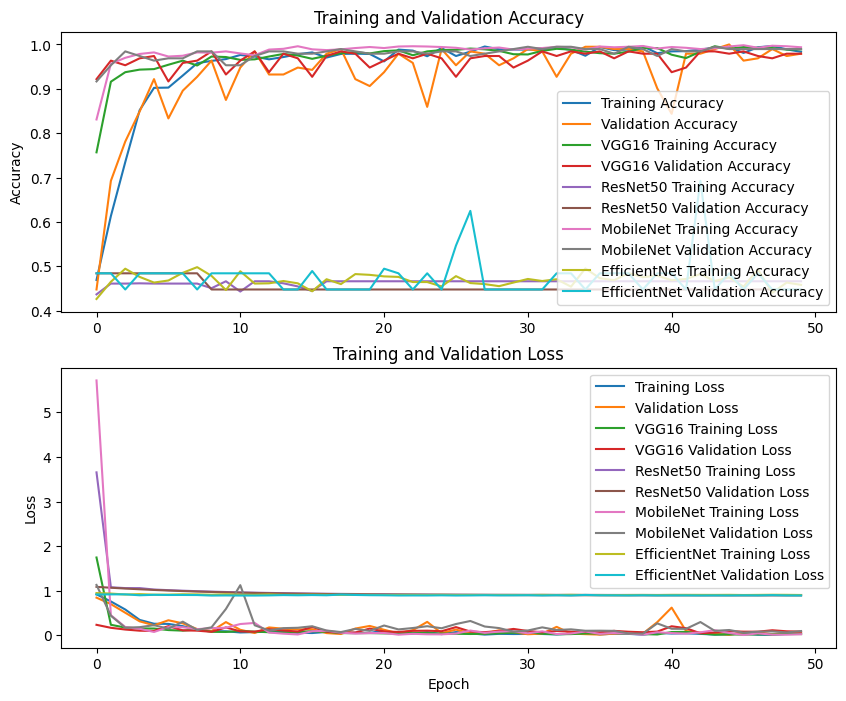

In [73]:
plt.figure(figsize=(10, 8))

# Training & Validation Accuracy
plt.subplot(2, 1, 1)
plt.plot(history_custom.history['accuracy'], label='Training Accuracy')
plt.plot(history_custom.history['val_accuracy'], label='Validation Accuracy')
plt.plot(history_vgg16.history['accuracy'], label='VGG16 Training Accuracy')
plt.plot(history_vgg16.history['val_accuracy'], label='VGG16 Validation Accuracy')
plt.plot(history_resnet50.history['accuracy'], label='ResNet50 Training Accuracy')
plt.plot(history_resnet50.history['val_accuracy'], label='ResNet50 Validation Accuracy')
plt.plot(history_mobilenet.history['accuracy'], label='MobileNet Training Accuracy')
plt.plot(history_mobilenet.history['val_accuracy'], label='MobileNet Validation Accuracy')
plt.plot(history_efficientnet.history['accuracy'], label='EfficientNet Training Accuracy')
plt.plot(history_efficientnet.history['val_accuracy'], label='EfficientNet Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')

# Training & Validation Loss
plt.subplot(2, 1, 2)
plt.plot(history_custom.history['loss'], label='Training Loss')
plt.plot(history_custom.history['val_loss'], label='Validation Loss')
plt.plot(history_vgg16.history['loss'], label='VGG16 Training Loss')
plt.plot(history_vgg16.history['val_loss'], label='VGG16 Validation Loss')
plt.plot(history_resnet50.history['loss'], label='ResNet50 Training Loss')
plt.plot(history_resnet50.history['val_loss'], label='ResNet50 Validation Loss')
plt.plot(history_mobilenet.history['loss'], label='MobileNet Training Loss')
plt.plot(history_mobilenet.history['val_loss'], label='MobileNet Validation Loss')
plt.plot(history_efficientnet.history['loss'], label='EfficientNet Training Loss')
plt.plot(history_efficientnet.history['val_loss'], label='EfficientNet Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.title('Training and Validation Loss')
plt.show()


8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step


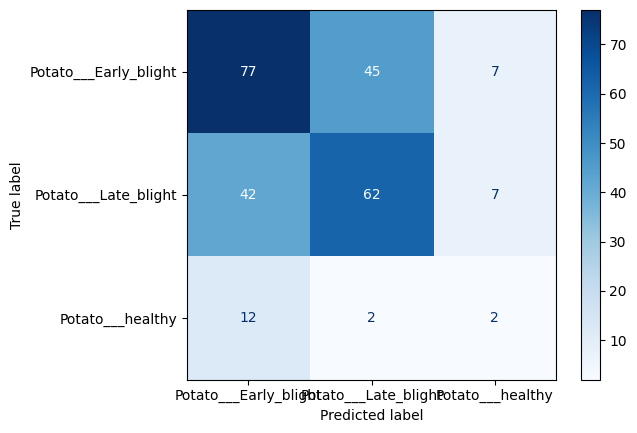

In [57]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Predict using one of your models
y_pred = custom_model.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.concatenate([y for x, y in test_ds], axis=0)

cm = confusion_matrix(y_true, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.show()


8/8 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step


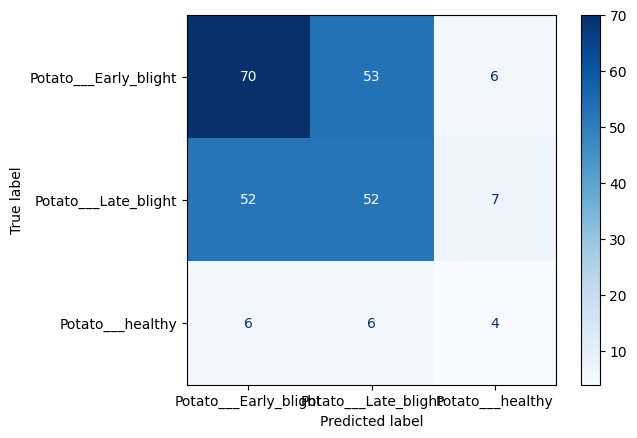

In [58]:
y_pred = model_vgg16.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.concatenate([y for x, y in test_ds], axis=0)

cm = confusion_matrix(y_true, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.show()

8/8 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step


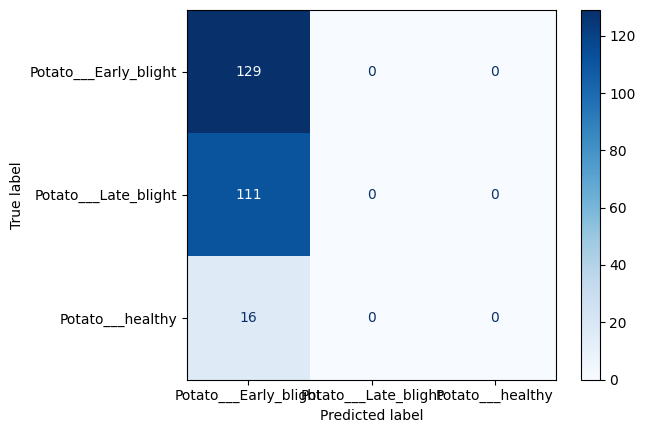

In [59]:
y_pred = model_resnet50.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.concatenate([y for x, y in test_ds], axis=0)

cm = confusion_matrix(y_true, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.show()

8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 875ms/step


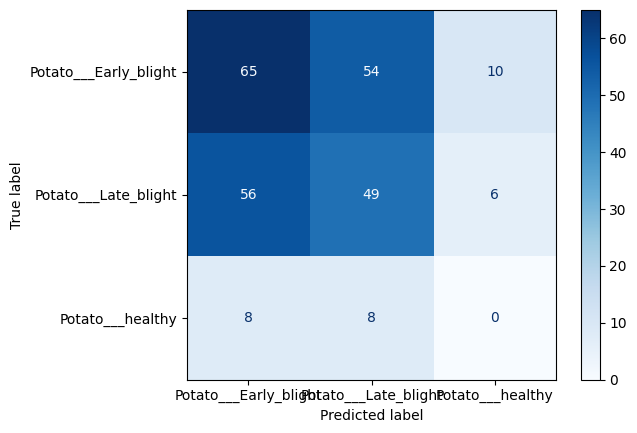

In [60]:
y_pred = model_mobilenet.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.concatenate([y for x, y in test_ds], axis=0)

cm = confusion_matrix(y_true, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.show()

8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step


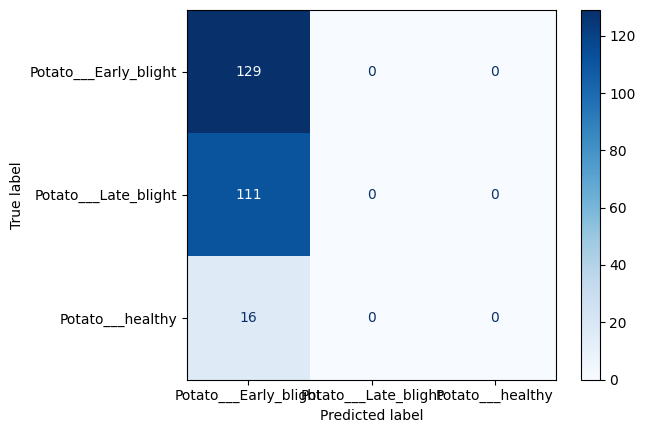

In [61]:
y_pred = model_efficientnet.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.concatenate([y for x, y in test_ds], axis=0)

cm = confusion_matrix(y_true, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.show()

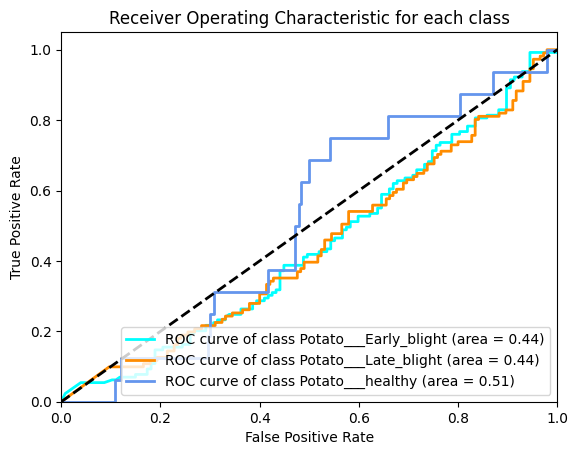

In [70]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import numpy as np
from itertools import cycle

# Binarize the output
y_true_binarized = label_binarize(y_true, classes=range(len(class_names)))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(class_names)):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curve for each class
plt.figure()
colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(len(class_names)), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(class_names[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for each class')
plt.legend(loc="lower right")
plt.show()


In [71]:
# Assuming you have trained models and datasets ready
models = {
    "Custom Model": custom_model,
    "VGG16": model_vgg16,
    "ResNet50": model_resnet50,
    "MobileNet": model_mobilenet,
    "EfficientNet": model_efficientnet
}

y_true = np.concatenate([y for x, y in test_ds], axis=0)

# Generate predictions for each model
y_preds = {}
for model_name, model in models.items():
    y_preds[model_name] = model.predict(test_ds)


8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 233ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step


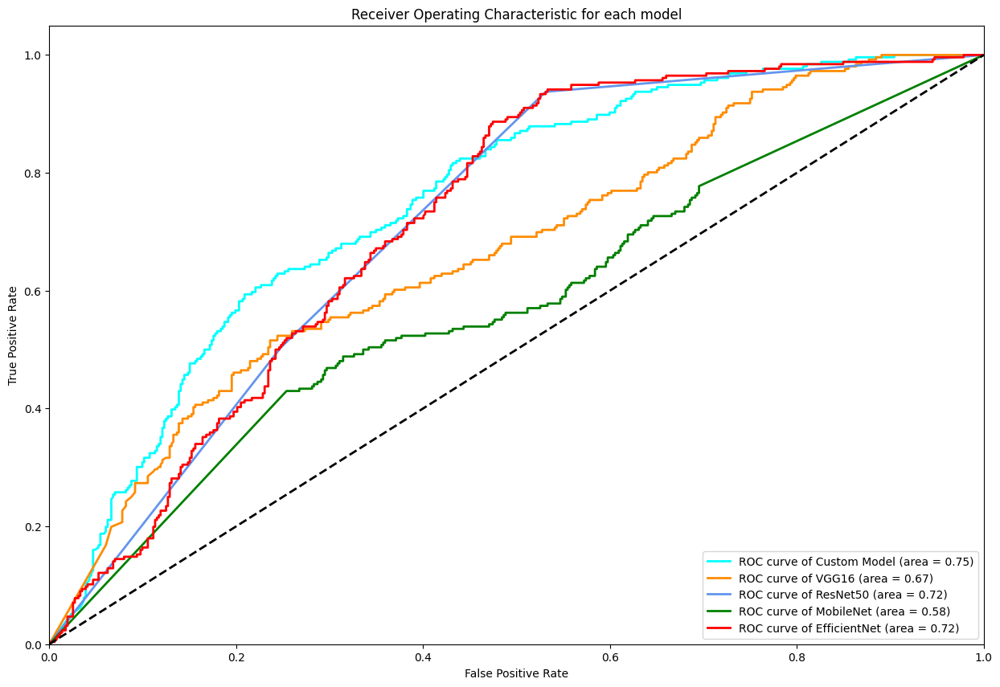

In [72]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle
import matplotlib.pyplot as plt

# Binarize the output
y_true_binarized = label_binarize(y_true, classes=range(len(class_names)))

# Initialize figure
plt.figure(figsize=(15, 10))

# Colors for each model's curve
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red'])

for (model_name, y_pred), color in zip(y_preds.items(), colors):
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_pred.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # Plot ROC curve for the micro-average
    plt.plot(fpr["micro"], tpr["micro"], color=color, lw=2,
             label='ROC curve of {} (area = {:0.2f})'.format(model_name, roc_auc["micro"]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for each model')
plt.legend(loc="lower right")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract average training time per epoch for each model
avg_time_per_epoch_data = {model: model_results[model]['avg_time_per_epoch'] for model in model_results}

plt.figure(figsize=(10, 6))
sns.barplot(x=list(avg_time_per_epoch_data.keys()), y=list(avg_time_per_epoch_data.values()))

plt.title('Average Training Time per Epoch for Each Model')
plt.ylabel('Time (seconds)')
plt.xlabel('Models')
plt.show()


In [ ]:
total_training_time_data = {model: model_results[model]['training_time'] for model in model_results}

plt.figure(figsize=(10, 6))
sns.barplot(x=list(total_training_time_data.keys()), y=list(total_training_time_data.values()))

plt.title('Total Training Time for Each Model')
plt.ylabel('Time (seconds)')
plt.xlabel('Models')
plt.show()


In [ ]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

# Function to evaluate model
def evaluate_model(model, test_ds):
    y_true = []
    y_pred = []
    
    for images, labels in test_ds:
        predictions = model.predict(images)
        y_true.extend(labels.numpy())
        y_pred.extend(tf.argmax(predictions, axis=1).numpy())
    
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    
    return accuracy, precision, recall, f1

# Custom model evaluation
accuracy_custom, precision_custom, recall_custom, f1_custom = evaluate_model(custom_model, test_ds)


# VGG16 model evaluation
accuracy_vgg16, precision_vgg16, recall_vgg16, f1_vgg16 = evaluate_model(vgg16_model, test_ds)
print(f"VGG16 Model - Accuracy: {accuracy_vgg16}, Precision: {precision_vgg16}, Recall: {recall_vgg16}, F1 Score: {f1_vgg16}")

# ResNet50 model evaluation
accuracy_resnet50, precision_resnet50, recall_resnet50, f1_resnet50 = evaluate_model(resnet50_model, test_ds)
print(f"ResNet50 Model - Accuracy: {accuracy_resnet50}, Precision: {precision_resnet50}, Recall: {recall_resnet50}, F1 Score: {f1_resnet50}")

# MobileNet model evaluation
accuracy_mobilenet, precision_mobilenet, recall_mobilenet, f1_mobilenet = evaluate_model(mobilenet_model, test_ds)
print(f"MobileNet Model - Accuracy: {accuracy_mobilenet}, Precision: {precision_mobilenet}, Recall: {recall_mobilenet}, F1 Score: {f1_mobilenet}")

# EfficientNet model evaluation
accuracy_efficientnet, precision_efficientnet, recall_efficientnet, f1_efficientnet = evaluate_model(efficientnet_model, test_ds)
print(f"EfficientNet Model - Accuracy: {accuracy_efficientnet}, Precision: {precision_efficientnet}, Recall: {recall_efficientnet}, F1 Score: {f1_efficientnet}")
